In [2]:
#!pip install quandl
#!pip install yfinance
#!pip install pandas-datareader

In [3]:
#!conda install nvidia::numba-cuda

# User
puedes corregir el codigo me da este error:
NvvmSupportError: libNVVM cannot be found. Do `conda install cudatoolkit`:
Could not find module 'nvvm.dll' (or one of its dependencies). Try using the full path with constructor syntax.

# Assistant
El error que estás viendo, `NvvmSupportError: libNVVM cannot be found`, indica que tu entorno de Python no puede encontrar la biblioteca NVVM, que es parte del toolkit de CUDA. Esto puede suceder si no tienes instalado el `cudatoolkit` o si la instalación no está configurada correctamente.

Para corregir este error, puedes seguir estos pasos:

1. **Instalar el `cudatoolkit`**: Abre tu terminal o consola de Anaconda y ejecuta el siguiente comando para instalar el `cudatoolkit`:

   

bash
   conda install cudatoolkit
   


2. **Verificar la instalación**: Asegúrate de que la instalación se haya completado sin errores. Puedes verificar si el `cudatoolkit` está instalado correctamente ejecutando:

   

bash
   conda list cudatoolkit
   


3. **Reiniciar el entorno**: Después de la instalación, es recomendable reiniciar tu entorno de Jupyter Notebook o cualquier otro entorno que estés utilizando para asegurarte de que los cambios surtan efecto.

4. **Verificar la configuración de CUDA**: Asegúrate de que tu sistema tenga los controladores de NVIDIA instalados y que sean compatibles con la versión del `cudatoolkit` que has instalado.

Si después de seguir estos pasos sigues teniendo problemas, verifica que la variable de entorno `PATH` incluya la ruta a las bibliotecas de CUDA. 

Si necesitas más ayuda, no dudes en preguntar.

In [10]:
import pandas as pd
import datetime as dt #for setting starting and ending dates
import numpy as np
import matplotlib.pyplot as plt #for visualisation
import scipy.stats as stats #for plots
import plotly.offline as pyo
import quandl
import yfinance as yf #for fetching real time data of stocks
import pylab
import seaborn as sns #built on top of matplotlib and is useful in providing useful interface for showing results
from datetime import datetime #for data retrival of MnC's finances
from pandas_datareader import data 

pd.options.plotting.backend='plotly'
pyo.init_notebook_mode(connected='True')

In [11]:
#Setting the begining and ending dates
today=datetime.now()
year_ago=datetime(today.year-1,today.month,today.day) #starting date= one yr prior to current date

In [12]:
!ls


AMZN.csv
EBAY.csv
GPU.png
MET.csv
MSFT.csv
Monte_carlo_simmulation.ipynb
NFLX.csv
Reporte_Final
TWTR.csv
Template for High Performance Computing.zip
normal.png


In [13]:
TWTR=pd.read_csv("TWTR.csv")
MET=pd.read_csv("MET.csv")
MSFT=pd.read_csv("MSFT.csv")
AMZN=pd.read_csv("AMZN.csv")
EBAY=pd.read_csv("EBAY.csv")
NFLX=pd.read_csv("NFLX.csv")

#SIX companies choosed for data extraction
company_list=['TWTR','MET','MSFT','AMZN','EBAY','NFLX']

In [14]:
TWTR.head(5)

,Date,Open,High,Low,Close,Adjusted Close,Volume
0,2013-11-07,45.099998,50.090000,44.000000,44.900002,44.900002,117701670.0
1,2013-11-08,45.930000,46.939999,40.685001,41.650002,41.650002,27925307.0
2,2013-11-11,40.500000,43.000000,39.400002,42.900002,42.900002,16113941.0
3,2013-11-12,43.660000,43.779999,41.830002,41.900002,41.900002,6316755.0
4,2013-11-13,41.029999,42.869999,40.759998,42.599998,42.599998,8688325.0


In [15]:
MET.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,05-04-2000,12.756239,12.923351,77084766,14.037433,13.814617,8.795564
1,06-04-2000,13.591800,13.703209,17167722,14.148841,13.870321,8.831029
2,07-04-2000,13.480392,13.703209,15131516,13.870321,13.647504,8.689166
3,10-04-2000,13.591800,13.758913,6324938,13.814617,13.758913,8.760098
4,11-04-2000,13.424688,13.647504,6087860,13.703209,13.480392,8.582770


In [16]:
MSFT.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,13-03-1986,0.088542,0.088542,1031788800,0.101563,0.097222,0.061751
1,14-03-1986,0.097222,0.097222,308160000,0.102431,0.100694,0.063956
2,17-03-1986,0.100694,0.100694,133171200,0.103299,0.102431,0.065059
3,18-03-1986,0.098958,0.102431,67766400,0.103299,0.099826,0.063405
4,19-03-1986,0.097222,0.099826,47894400,0.100694,0.098090,0.062302


In [17]:
AMZN.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,15-05-1997,1.927083,2.437500,72156000,2.500000,1.958333,1.958333
1,16-05-1997,1.708333,1.968750,14700000,1.979167,1.729167,1.729167
2,19-05-1997,1.625000,1.760417,6106800,1.770833,1.708333,1.708333
3,20-05-1997,1.635417,1.729167,5467200,1.750000,1.635417,1.635417
4,21-05-1997,1.375000,1.635417,18853200,1.645833,1.427083,1.427083


In [18]:
EBAY.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,24-09-1998,0.775989,0.938201,518656000,0.951354,0.830791,0.804280
1,25-09-1998,0.721188,0.797910,121255800,0.808870,0.786949,0.761838
2,28-09-1998,0.806678,0.832983,89772800,0.892168,0.846135,0.819135
3,29-09-1998,0.837367,0.865864,39289500,0.881208,0.857095,0.829746
4,30-09-1998,0.758453,0.827502,44113700,0.841751,0.790237,0.765021


In [19]:
NFLX.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,23-05-2002,1.145714,1.156429,104790000,1.242857,1.196429,1.196429
1,24-05-2002,1.197143,1.214286,11104800,1.225000,1.210000,1.210000
2,28-05-2002,1.157143,1.213571,6609400,1.232143,1.157143,1.157143
3,29-05-2002,1.085714,1.164286,6757800,1.164286,1.103571,1.103571
4,30-05-2002,1.071429,1.107857,10154200,1.107857,1.071429,1.071429


In [20]:
TWTR.info()
#column datatypes, data stored in dataframe, gives a brief summary of the insights

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2264 entries, 0 to 2263
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            2264 non-null   object 
 1   Open            2259 non-null   float64
 2   High            2259 non-null   float64
 3   Low             2259 non-null   float64
 4   Close           2259 non-null   float64
 5   Adjusted Close  2259 non-null   float64
 6   Volume          2259 non-null   float64
dtypes: float64(6), object(1)
memory usage: 123.9+ KB


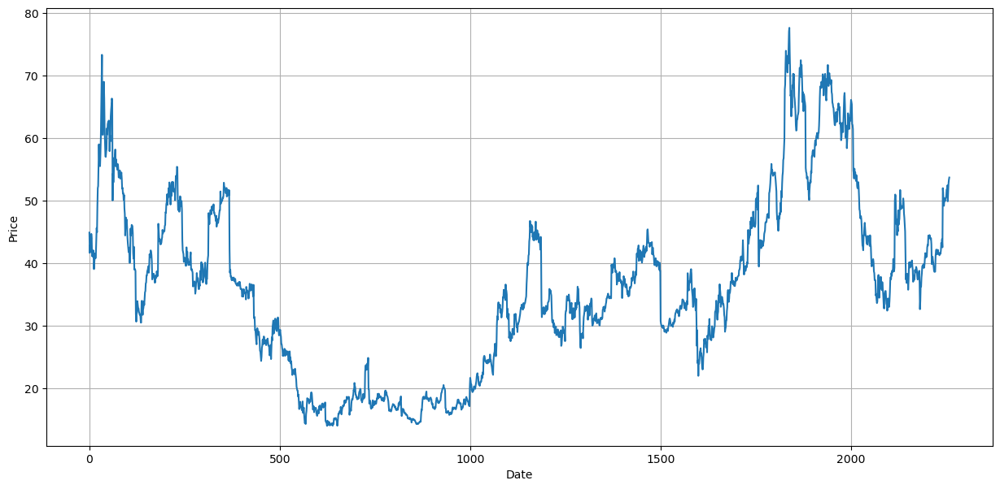

In [21]:
plt.figure(figsize=(15,7))
plt.plot(TWTR['Adjusted Close'])
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid()
plt.show()

In [22]:
print('First',TWTR.Close[0],'End', TWTR.Close[2258]) 
#Here we can see how the prices varied, intial vs closing

First 44.900002 End 53.700001


Above is the starting and ending price of the asset choosen within the timeframe

In [24]:
# We can also compute log returns as its time additive
log_returns=np.log(TWTR.Close/TWTR.Close.shift(1)).dropna() #we also dropped the nans 
log_returns

1      -0.075136
2       0.029570
3      -0.023586
4       0.016568
5       0.047896
          ...   
2254   -0.049849
2255    0.032150
2256    0.024162
2257    0.010742
2258    0.006539
Name: Close, Length: 2258, dtype: float64

In [25]:
log_returns.mean() #take the mean of log_Rreturns

7.926270188004978e-05

In [26]:
TWTR.Close[0]*(np.exp(log_returns.mean()*len(log_returns)))

53.70000099999985

In [27]:
# Lets try to calculate the same using simple returns and see how it compares
simple_returns = TWTR.Close.pct_change(fill_method=None).dropna()
simple_returns

1      -0.072383
2       0.030012
3      -0.023310
4       0.016706
5       0.049061
          ...   
2254   -0.048627
2255    0.032672
2256    0.024457
2257    0.010800
2258    0.006561
Name: Close, Length: 2258, dtype: float64

In [28]:
simple_returns.mean() # calculate the mean of simple_returns

0.0006615739123036293

In [29]:
TWTR.Close[0]*(np.prod([(1+Rt) for Rt in simple_returns]))

53.700001

Above, we find the closing price of twitter using simple returns.

In [31]:
#Histogram of log returns
log_returns.plot(kind='hist')


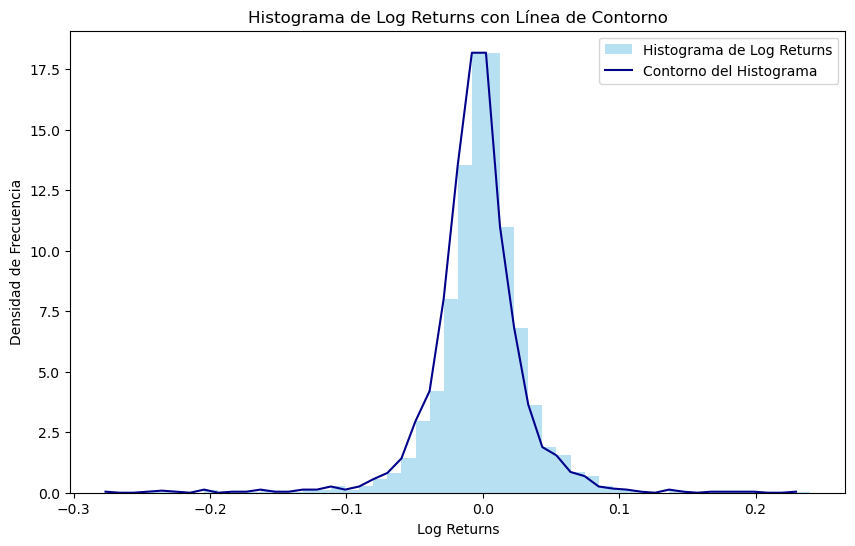

In [32]:
import matplotlib.pyplot as plt
import numpy as np

# Calcular el histograma de los log returns
count, bins = np.histogram(log_returns, bins=50, density=True)

# Graficar el histograma con barras
plt.figure(figsize=(10, 6))
plt.hist(log_returns, bins=50, density=True, alpha=0.6, color='skyblue', label='Histograma de Log Returns')

# Dibujar el contorno del histograma
plt.plot(bins[:-1], count, linestyle='-', color='darkblue', label='Contorno del Histograma')

# Añadir título y etiquetas
plt.title("Histograma de Log Returns con Línea de Contorno")
plt.xlabel("Log Returns")
plt.ylabel("Densidad de Frecuencia")
plt.legend()

# Mostrar el gráfico
plt.show()




In [33]:
log_returns.plot()

In [34]:
# lets take the best and the worst case and see the std deviation and the probability of occurances if its assumed to be normal
log_returns_sorted=log_returns.tolist()
log_returns_sorted.sort()
# Here we sorted all the log returns according to their value,
# to get the lowest and the highest case (the leftmost and the Rightmost case in the Histogram)

worst=log_returns_sorted[0]
best=log_returns_sorted[-1]

std_worst=(worst-log_returns.mean())/log_returns.std()
std_best=(best-log_returns.mean())/log_returns.std()
# here we normalise it

print('Std dev. worst %.2f best %.2f' %(std_worst,std_best))

Std dev. worst -8.07 best 7.00


# Testing for normality

Q-Q PLOT


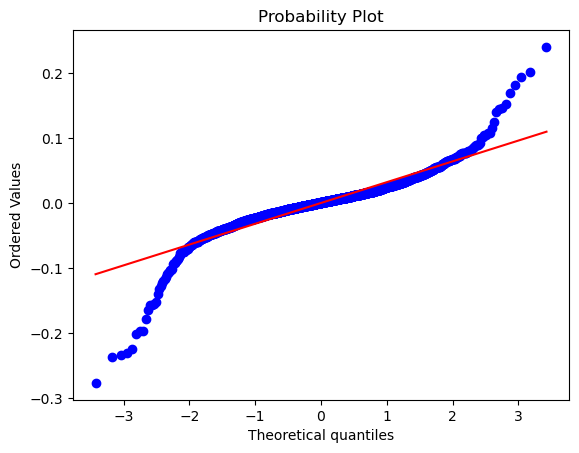

In [36]:
stats.probplot(log_returns, dist='norm', plot=pylab)
print('Q-Q PLOT')

In [37]:
MSFT['Close'].plot()


In [38]:
MSFT['Adjusted Close'].plot()

In [39]:
NFLX['Adjusted Close'].plot()

In [40]:
MET['Adjusted Close'].plot()

In [41]:
EBAY['Adjusted Close'].plot()

We then incorporate moving averages to eliminate fluctuations and this process is called smoothing of time series. It reduces the amount of variations present in the data. The main advantage of SMA is that it offers a smoothed line, less prone to whipsawing. Its often favoured by traders operating on longer time frames such as daily or weekly charts

In [43]:
MSFT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8833 entries, 0 to 8832
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            8833 non-null   object 
 1   Low             8833 non-null   float64
 2   Open            8833 non-null   float64
 3   Volume          8833 non-null   int64  
 4   High            8833 non-null   float64
 5   Close           8833 non-null   float64
 6   Adjusted Close  8833 non-null   float64
dtypes: float64(5), int64(1), object(1)
memory usage: 483.2+ KB


In [44]:
#Number of days for which moving average will be calculated
MA_days = list(range(1, 28, 4))
for ma in MA_days:
    ma_str = "MA: {}".format(ma)
    TWTR[ma_str] = TWTR['Adjusted Close'].rolling(ma).mean()
    MET[ma_str] = MET['Adjusted Close'].rolling(ma).mean()
    MSFT[ma_str] = MSFT['Adjusted Close'].rolling(ma).mean()
    AMZN[ma_str] = AMZN['Adjusted Close'].rolling(ma).mean()
    NFLX[ma_str] = NFLX['Adjusted Close'].rolling(ma).mean()
    EBAY[ma_str] = EBAY['Adjusted Close'].rolling(ma).mean()

In [45]:
def plot_graphic(company, company_string, MA_days):
    plt.figure(figsize=(15, 6))
    
    # Plot the Adjusted Close price
    plt.plot(company['Adjusted Close'], label='Adjusted Close')
    
    # Plot each moving average
    for i in MA_days:
        plt.plot(company[f'MA: {i}'], label=f'MA: {i}')
    
    # Setting the title and labels
    plt.title(company_string)
    plt.xlabel('Date')
    plt.ylabel('Price')
    
    # Show legend and grid
    plt.legend()
    plt.grid()
    plt.show()


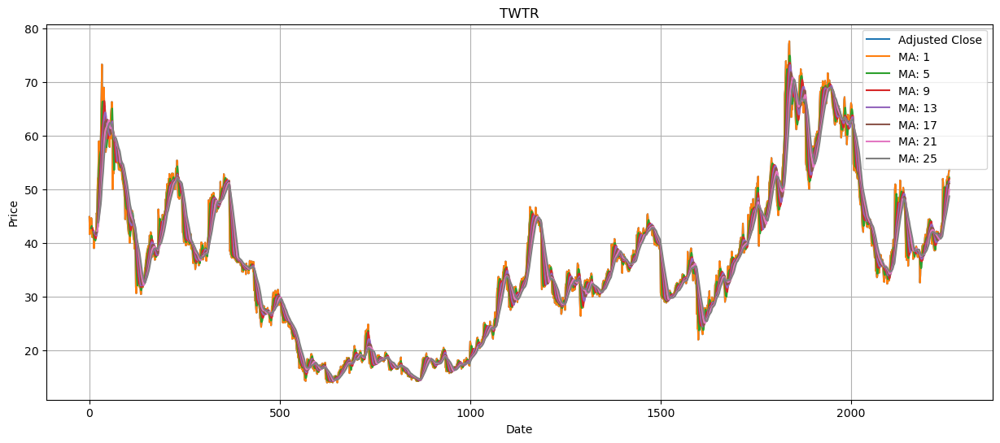

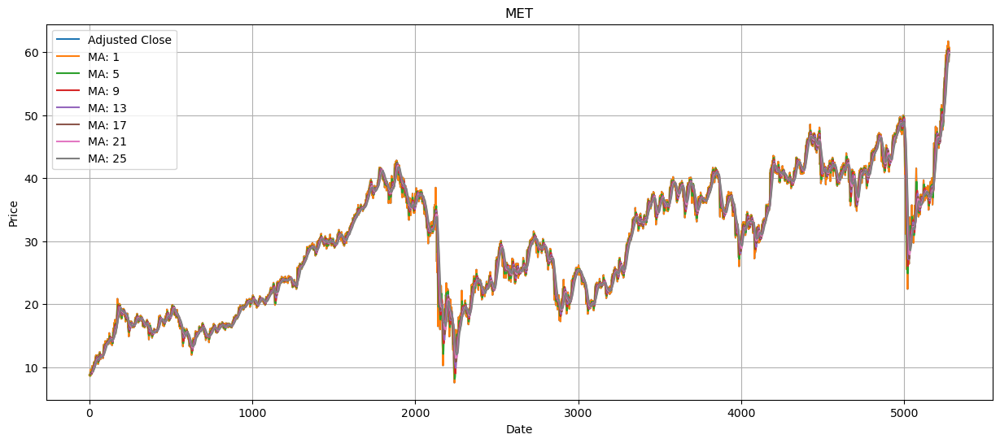

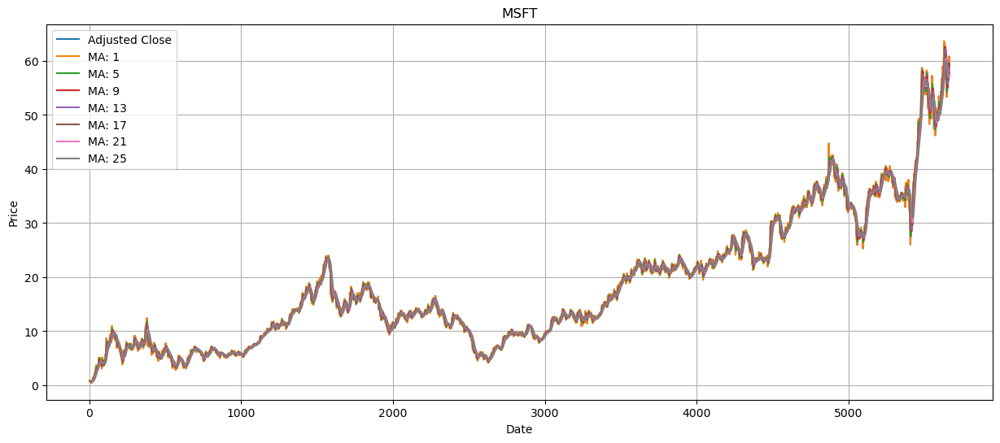

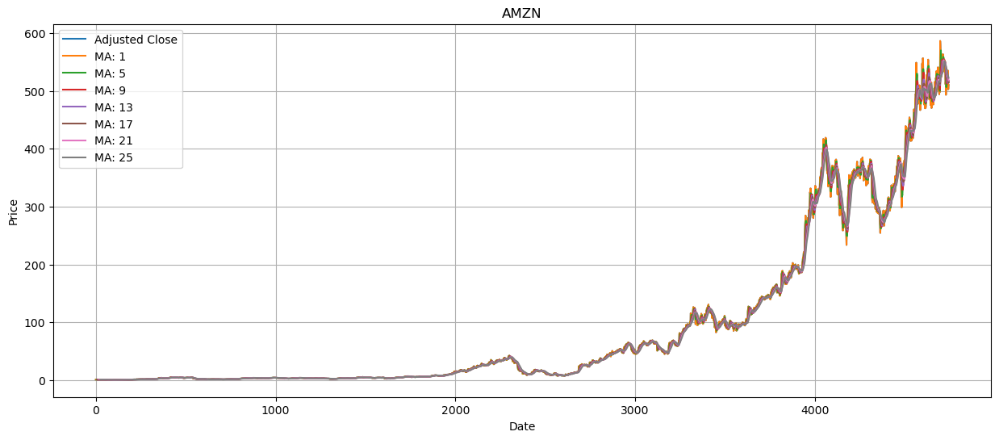

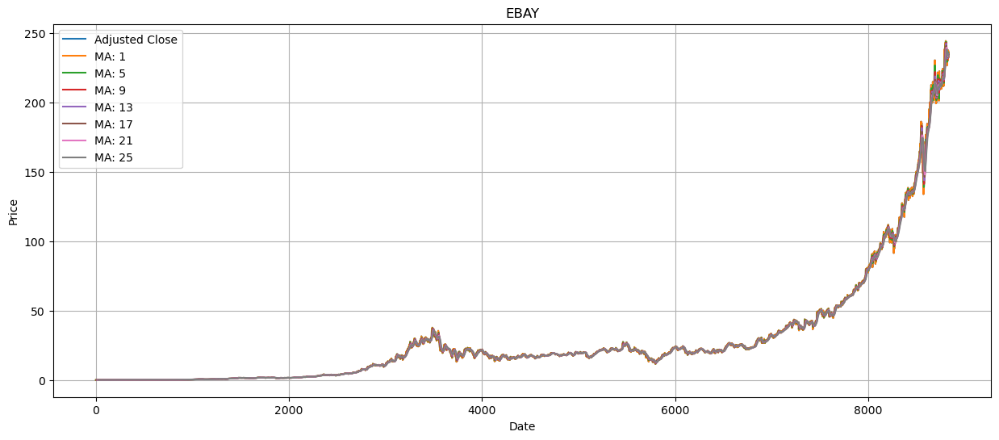

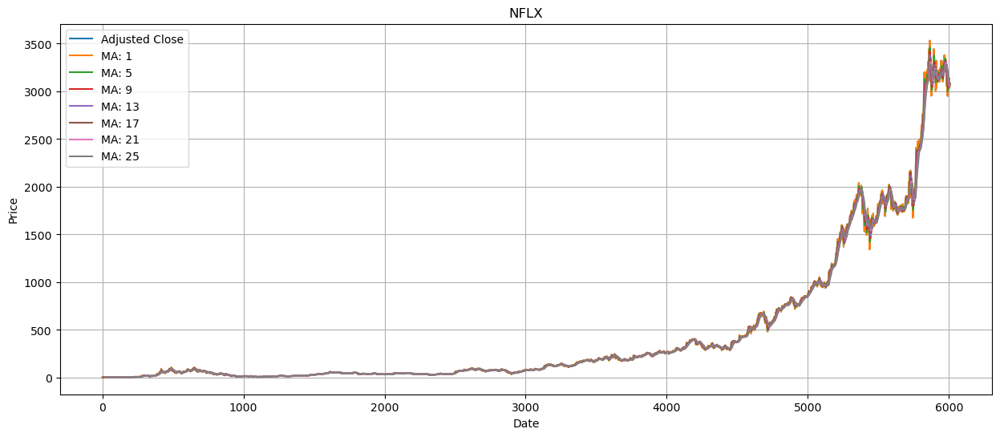

In [46]:
data_list = [ TWTR,MET, EBAY,NFLX, MSFT, AMZN]

for i in range(len(data_list)):   
    plot_graphic(data_list[i], company_list[i], MA_days)

C:\Users\crisa\AppData\Local\Temp\ipykernel_11692\4294709647.py:4: FutureWarning:

The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



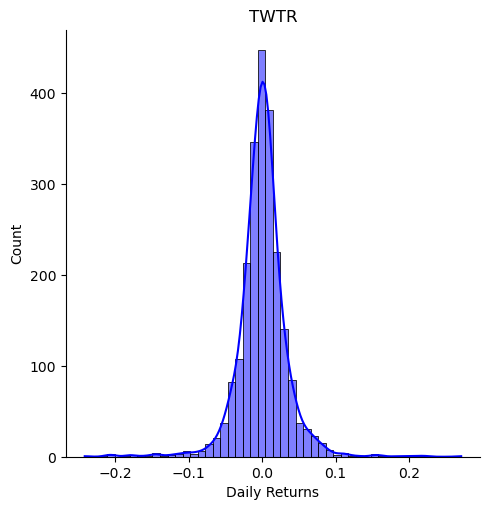

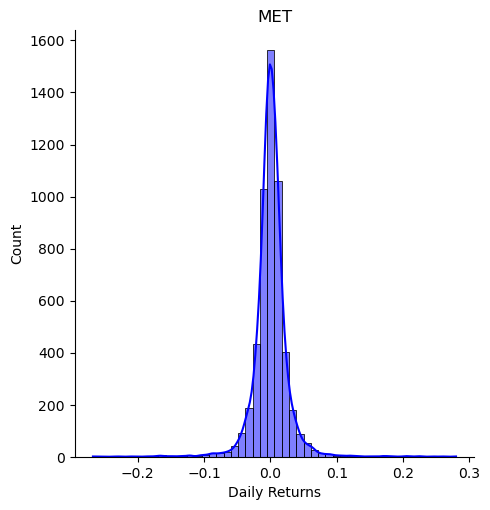

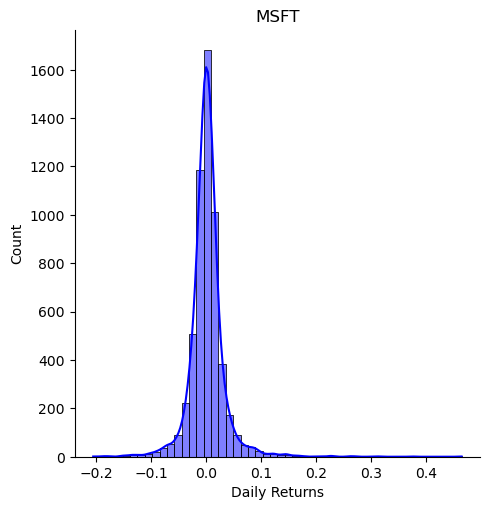

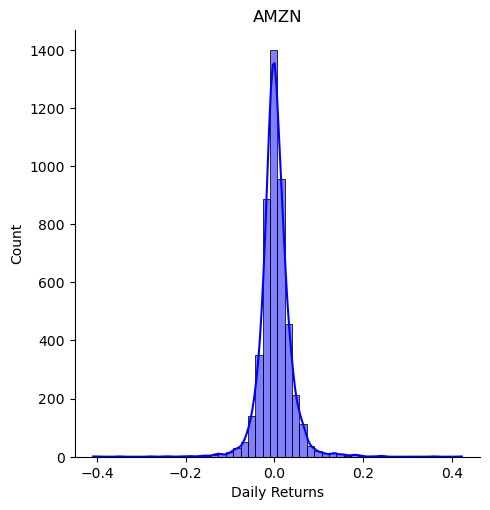

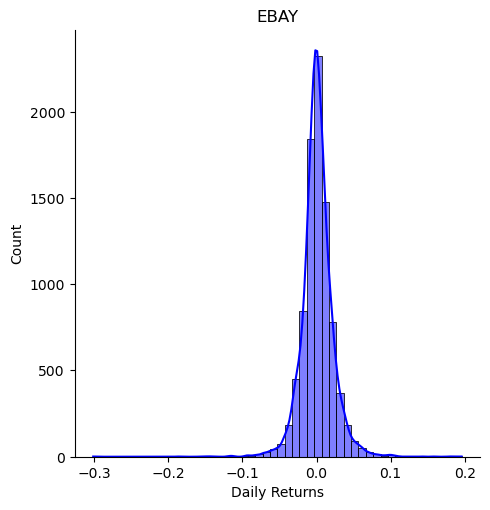

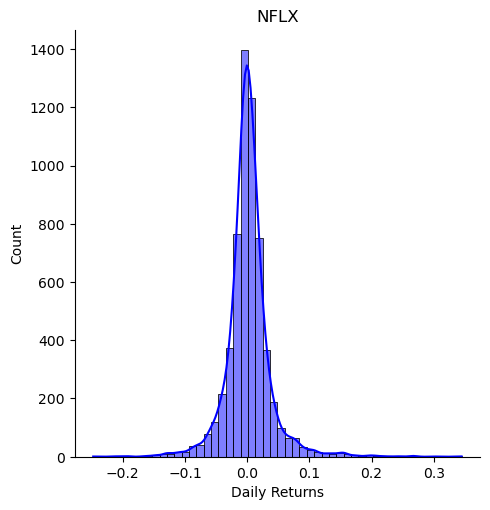

In [47]:
# Calculate returns and draw distribution

for i in range(len(data_list)):
    data_list[i]['Daily Returns'] = data_list[i]['Adjusted Close'].pct_change()
    sns.displot(data_list[i]['Daily Returns'].dropna(), bins=50, color='blue', kde=True)
    plt.title(company_list[i])
    plt.show()

In [48]:
import pandas as pd

# Assuming data_list is a list of dictionaries with 'Daily Returns' as a key and the values are pandas Series
daily_returns_list = [data['Daily Returns'] for data in data_list]

# Concatenate the daily return series along the columns axis
stock_returns = pd.concat(daily_returns_list, axis=1)

# Set the columns names to match the company_list
stock_returns.columns = company_list

# Display the first few rows of the resulting DataFrame
stock_returns.head()

,TWTR,MET,MSFT,AMZN,EBAY,NFLX
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.072383,0.004032,-0.052770,0.011343,0.035713,-0.117021
2,0.030012,-0.016064,0.075209,-0.043684,0.017250,-0.012049
3,-0.023310,0.008163,0.012953,-0.046296,-0.025432,-0.042683
4,0.016706,-0.020243,-0.078005,-0.029126,-0.017391,-0.127389


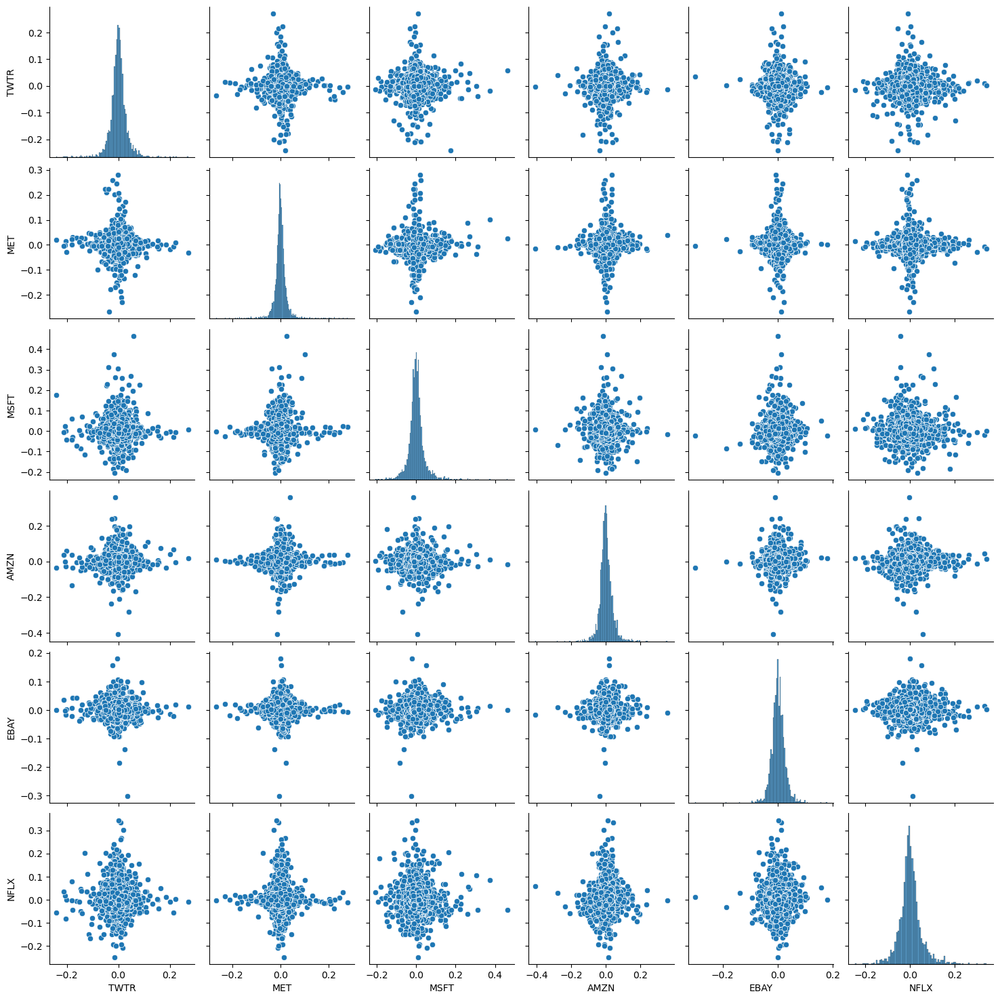

In [49]:
sns.pairplot(stock_returns.dropna())


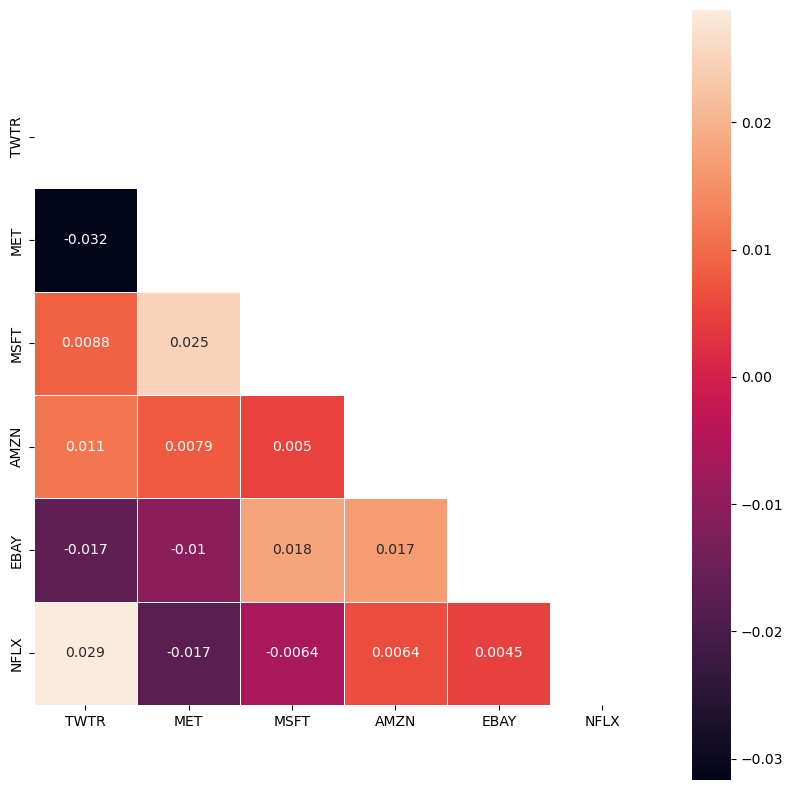

In [50]:
# Build correlation matrix
corr = stock_returns.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(10, 10))
sns.heatmap(corr, mask=mask,  square=True, linewidths=.5, annot=True)
plt.show()

In [51]:
mean_income = stock_returns.mean() # Mean income for each stock
cov_returns = stock_returns.cov() # Covariation 
count = len(stock_returns.columns)
print(mean_income, cov_returns, sep='\n')

TWTR    0.000660
MET     0.000705
MSFT    0.001283
AMZN    0.001931
EBAY    0.001164
NFLX    0.001891
dtype: float64
          TWTR       MET      MSFT      AMZN      EBAY      NFLX
TWTR  0.001151 -0.000033  0.000013  0.000016 -0.000014  0.000050
MET  -0.000033  0.000683  0.000022  0.000007 -0.000006 -0.000018
MSFT  0.000013  0.000022  0.001071  0.000006  0.000014 -0.000008
AMZN  0.000016  0.000007  0.000006  0.001303  0.000015  0.000009
EBAY -0.000014 -0.000006  0.000014  0.000015  0.000461  0.000004
NFLX  0.000050 -0.000018 -0.000008  0.000009  0.000004  0.001358


In [52]:
# Function, that generate random shares
def randomPortfolio():
    share = np.exp(np.random.randn(count))
    share = share / share.sum()
    return share

In [53]:
def IncomePortfolio(Rand):
    return np.matmul(mean_income.values, Rand)


def RiskPortfolio(Rand):
    return np.sqrt(np.matmul(np.matmul(Rand, cov_returns.values), Rand))

In [54]:
combinations = 10000
risk = np.zeros(combinations)
income = np.zeros(combinations)
portfolio = np.zeros((combinations, count))

# Function, which create new combinations of shares
for i in range(combinations):
    rand = randomPortfolio()

    portfolio[i, :] = rand
    risk[i] = RiskPortfolio(rand)
    income[i] = IncomePortfolio(rand)

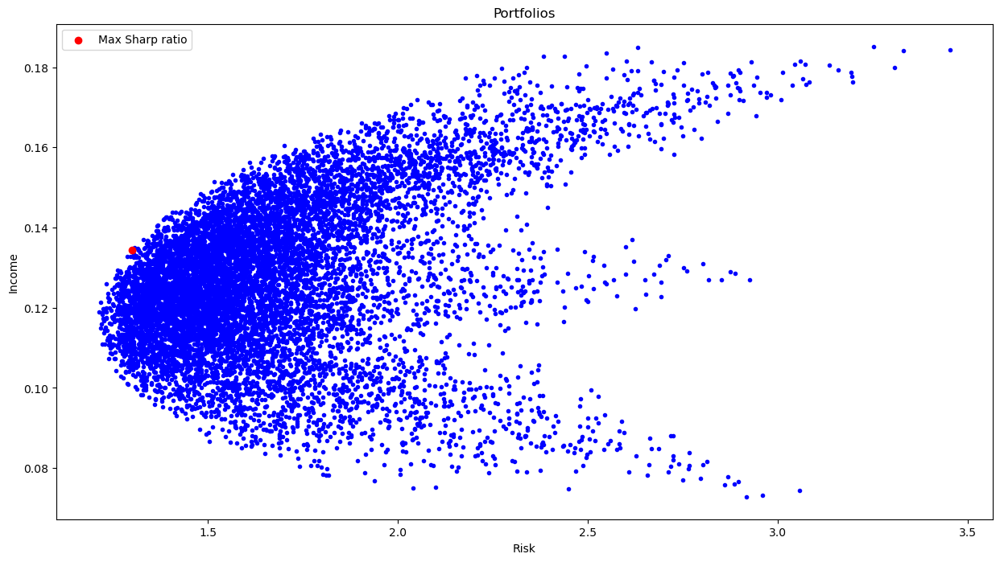

In [55]:
plt.figure(figsize=(15, 8))

plt.scatter(risk * 100, income * 100, c="b", marker=".")
plt.xlabel("Risk")
plt.ylabel("Income")
plt.title("Portfolios")
MaxSharpRatio = np.argmax(income / risk)
plt.scatter([risk[MaxSharpRatio] * 100], [income[MaxSharpRatio] * 100], c="r", marker="o", label="Max Sharp ratio")

plt.legend()
plt.show()

In [56]:
print("Max sharp ratios,", portfolio[MaxSharpRatio])

Max sharp ratios, [0.04095268 0.16937003 0.15035877 0.17019574 0.2909435  0.17817929]


Below we find the best portfolio out of all

In [58]:
best_port = portfolio[MaxSharpRatio]
for i in range(len(company_list)):
    print("{} : {}".format(company_list[i], best_port[i]))

TWTR : 0.040952677404442896
MET : 0.16937002512492313
MSFT : 0.15035877292863548
AMZN : 0.17019573511430225
EBAY : 0.2909434954263562
NFLX : 0.17817929400134


In [59]:
days = 365
dt = 1 / days
# here I have divided by 365 but usually we do by 252 (the number of trading days)
stock_returns.dropna(inplace=True)

mu = stock_returns.mean()
sigma = stock_returns.std()

In [60]:
def monte_carlo(start_price, days, mu, sigma):
    price = np.zeros(days)
    price[0] = start_price
    
    shock = np.zeros(days)
    drift = np.zeros(days)
    
    for x in range(1, days):
        shock[x] = np.random.normal(loc=mu * dt, scale=sigma*np.sqrt(dt))
        drift[x] = mu * dt
        
        price[x] = price[x-1] + (price[x-1] * (drift[x] + shock[x]))
        
    return price

In [61]:
mu

TWTR    0.000660
MET     0.000709
MSFT    0.002287
AMZN    0.002295
EBAY    0.001949
NFLX    0.002526
dtype: float64

In [62]:
sigma

TWTR    0.033922
MET     0.030736
MSFT    0.044815
AMZN    0.039963
EBAY    0.025220
NFLX    0.051154
dtype: float64

Tiempo transcurrido 21.74238920211792


Text(0.5, 1.0, 'Monte Carlo analysis for Twitter')

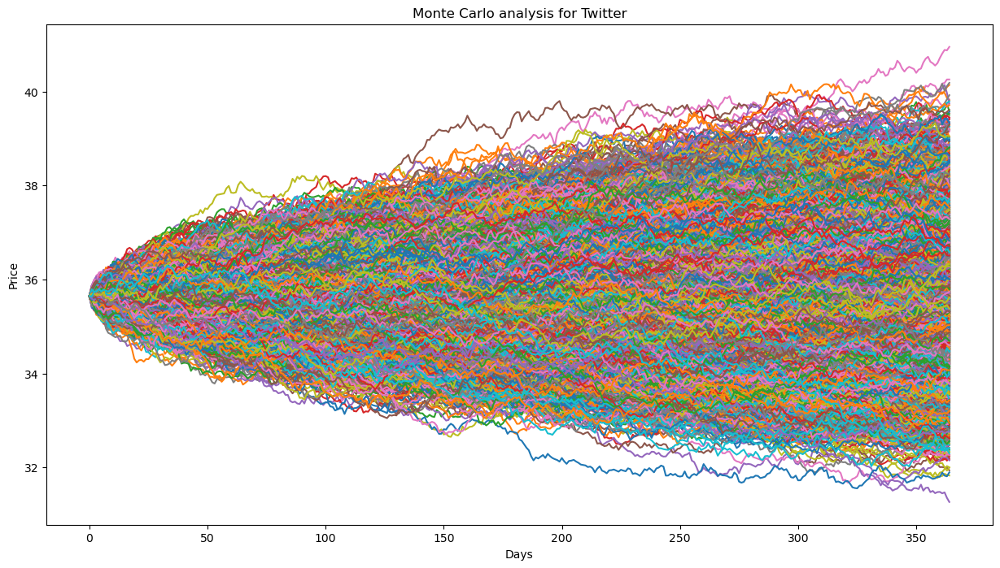

In [63]:
import time 
start_price = 35.65
n=10000
sim = np.zeros(n)

plt.figure(figsize=(15, 8))
start = time.time()
for i in range(n):
    result = monte_carlo(start_price, days, mu['TWTR'], sigma['TWTR'])
    sim[i] = result[days - 1]
    plt.plot(result)    
end = time.time()

print("Tiempo transcurrido", end-start)
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Twitter')


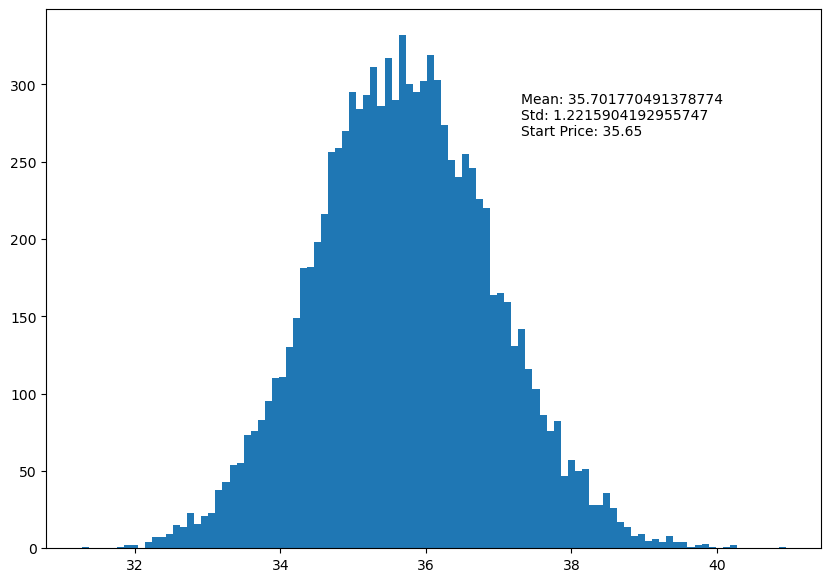

In [64]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

## Using CUDA

C:\Users\crisa\anaconda3\Lib\site-packages\numba\cuda\dispatcher.py:536: NumbaPerformanceWarning:

Grid size 1 will likely result in GPU under-utilization due to low occupancy.



Tiempo transcurrido: 0.6000823974609375


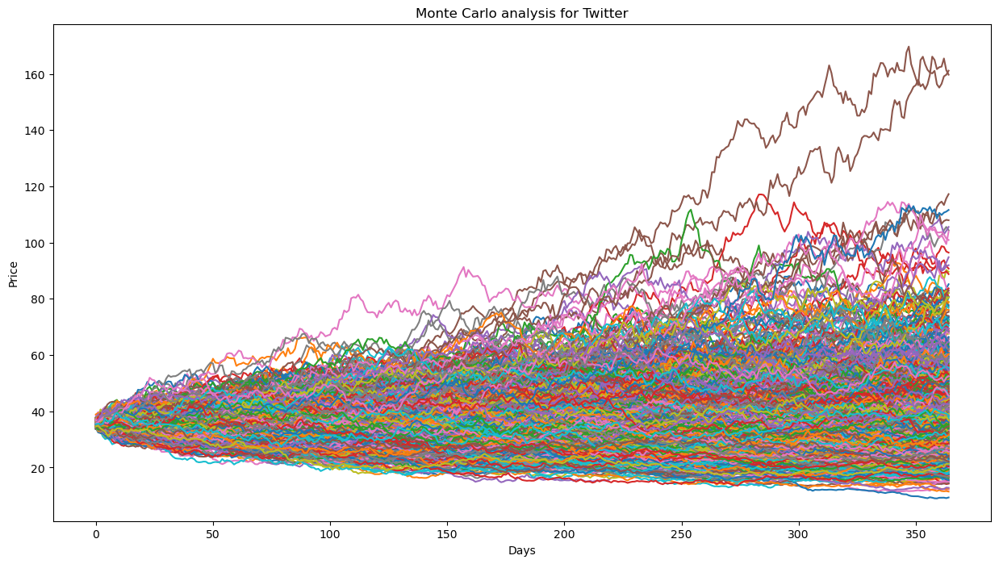

In [66]:
##### import time
import numpy as np
from numba import cuda, float32
import matplotlib.pyplot as plt
import math

# Parameters
start_price = 35.65
days = 365  # Number of days in the simulation
mu_value = 0.0002  # Mean return (as a scalar)
sigma_value = 0.02  # Volatility (as a scalar)
num_simulations = 1000  # Number of Monte Carlo simulations

# Define the CUDA kernel to run multiple simulations in parallel
@cuda.jit
def monte_carlo_cuda(start_price, days, mu, sigma, random_vals, simulations):
    idx = cuda.grid(1)  # Get the index of the thread
    if idx < simulations.shape[0]:
        # Initialize the first price
        current_price = start_price
        for t in range(days):
            # Get the precomputed random value from random_vals array
            rand = random_vals[idx, t]
            # Calculate the next price
            current_price *= math.exp((mu - 0.5 * sigma**2) + sigma * rand)
            # Store the result
            simulations[idx, t] = current_price

# Generate random values on the CPU
random_vals = np.random.normal(0, 1, (num_simulations, days)).astype(np.float32)

# Allocate space for the simulations on the device
simulations = np.zeros((num_simulations, days), dtype=np.float32)
d_random_vals = cuda.to_device(random_vals)
d_simulations = cuda.to_device(simulations)

# Adjust grid and block dimensions for CUDA
threads_per_block = 1024
blocks = (num_simulations + (threads_per_block - 1)) // threads_per_block

# Start timing
start = time.time()

# Run Monte Carlo simulations in parallel on the GPU
monte_carlo_cuda[blocks, threads_per_block](start_price, days, mu_value, sigma_value, d_random_vals, d_simulations)

# Copy the results back to the host
simulations = d_simulations.copy_to_host()

# End timing
end = time.time()

# Print the elapsed time
print("Tiempo transcurrido:", end - start)

# Plot the results
plt.figure(figsize=(15, 8))
for i in range(num_simulations):
    plt.plot(simulations[i])

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Twitter')
plt.show()


Text(0.5, 1.0, 'Monte Carlo analysis for EBAY')

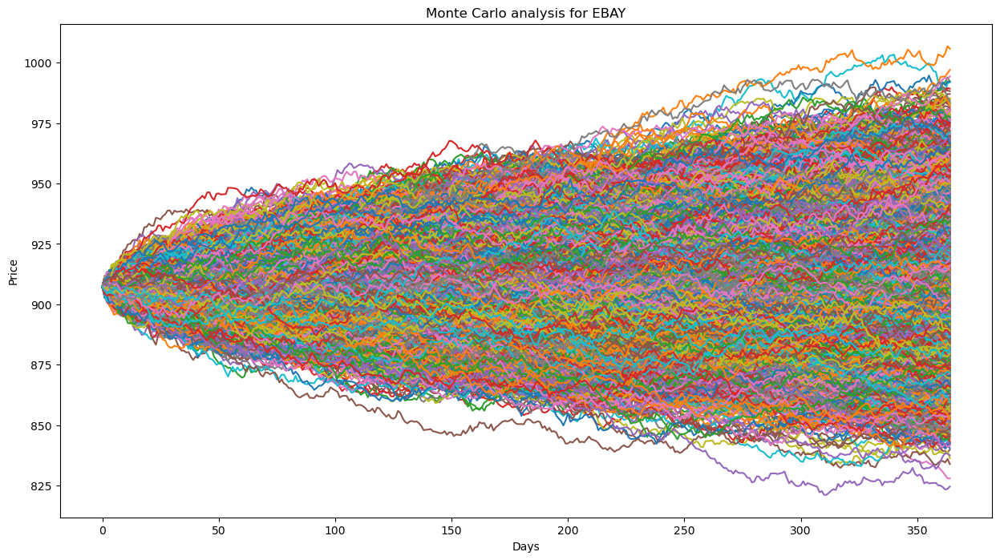

In [67]:
start_price = 907.34
sim = np.zeros(10000)

plt.figure(figsize=(15, 8))
for i in range(10000):
    result = monte_carlo(start_price, days, mu['EBAY'], sigma['EBAY'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for EBAY')


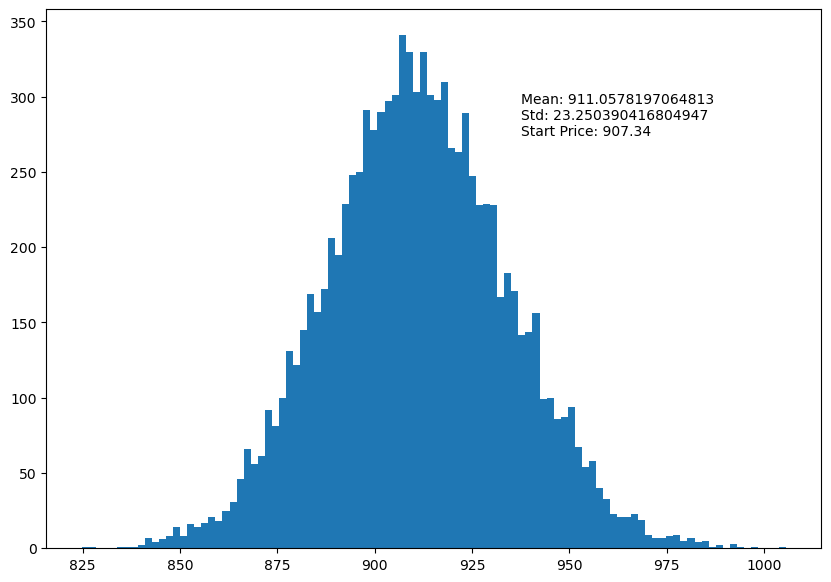

In [68]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Microsoft')

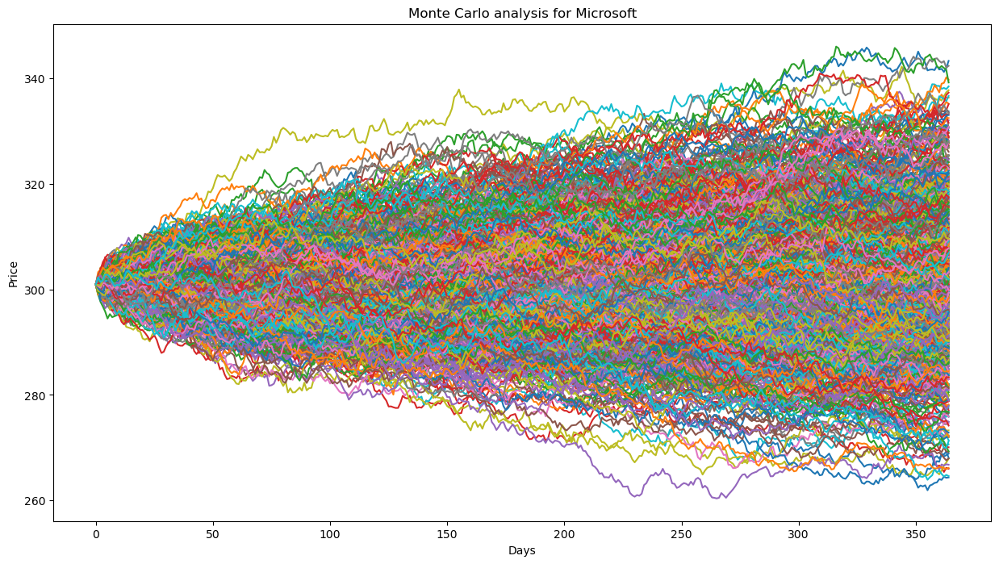

In [69]:
start_price = 300.95
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['MSFT'], sigma['MSFT'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Microsoft')

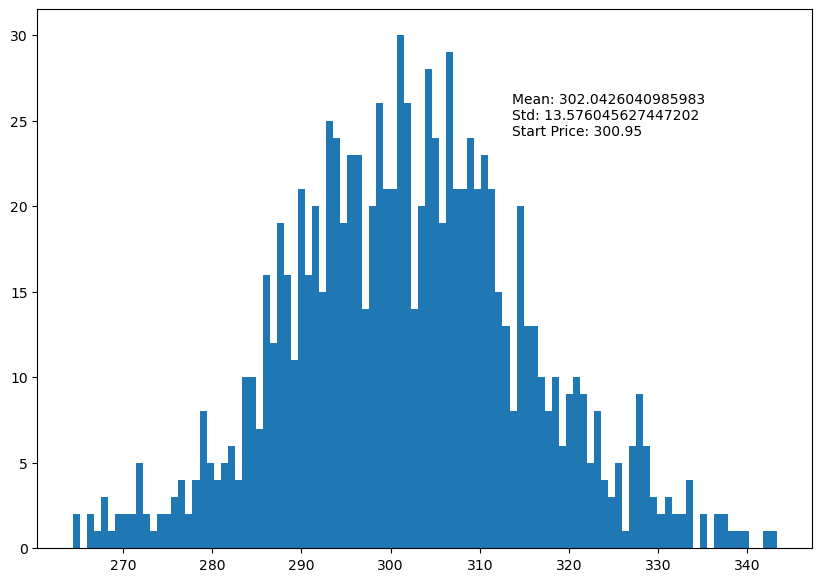

In [70]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Amazon')

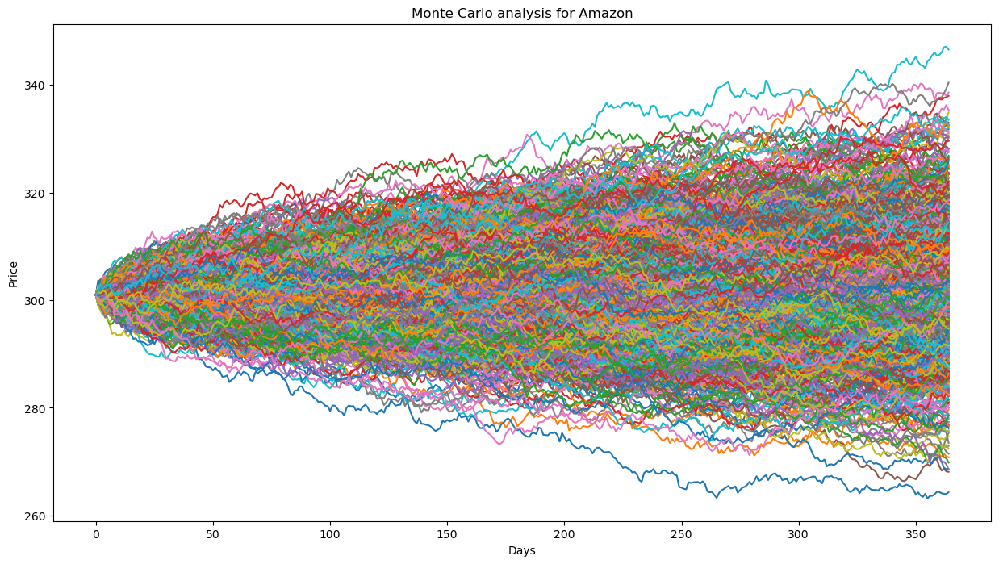

In [71]:
start_price = 300.95
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['AMZN'], sigma['AMZN'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Amazon')

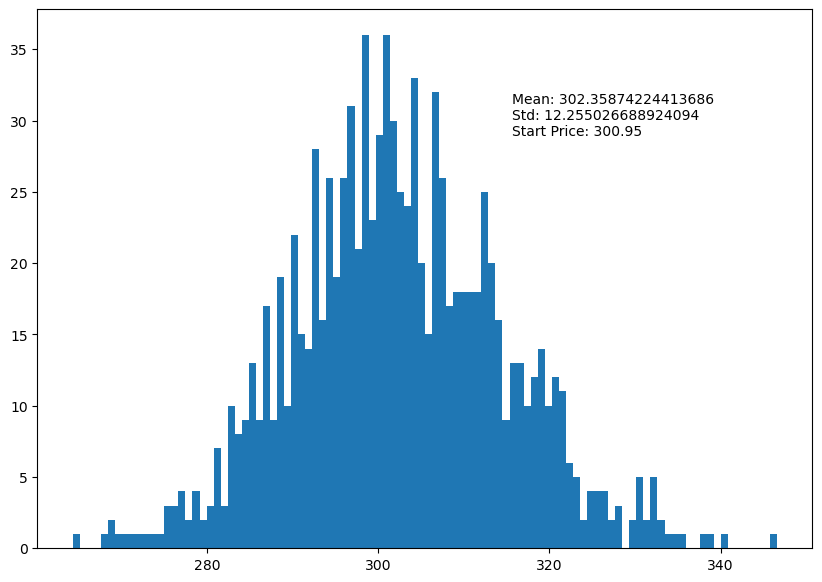

In [72]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

In [73]:
# lets import more data
df = yf.download(['AAPL', 'NKE', 'GOOGL', 'AMZN'], start='2015-01-01', end='2019-12-31')
df.head()

[*********************100%***********************]  4 of 4 completed


Price                      Adj Close                                 \
Ticker                          AAPL     AMZN      GOOGL        NKE   
Date                                                                  
2015-01-02 00:00:00+00:00  24.347170  15.4260  26.412100  42.353622   
2015-01-05 00:00:00+00:00  23.661268  15.1095  25.908844  41.671703   
2015-01-06 00:00:00+00:00  23.663502  14.7645  25.269430  41.426586   
2015-01-07 00:00:00+00:00  23.995314  14.9210  25.195112  42.282299   
2015-01-08 00:00:00+00:00  24.917269  15.0230  25.282898  43.258362   

Price                          Close                                 \
Ticker                          AAPL     AMZN      GOOGL        NKE   
Date                                                                  
2015-01-02 00:00:00+00:00  27.332500  15.4260  26.477501  47.514999   
2015-01-05 00:00:00+00:00  26.562500  15.1095  25.973000  46.750000   
2015-01-06 00:00:00+00:00  26.565001  14.7645  25.332001  46.474998   
2015-01-07 00:00:00+00:00  26.937500  14.9210  25.257500  47.435001   
2015-01-08 00:00:00+00:00  27.972500  15.0230  25.345501  48.529999   

Price                           High           ...        Low             \
Ticker                          AAPL     AMZN  ...      GOOGL        NKE   
Date                                           ...                         
2015-01-02 00:00:00+00:00  27.860001  15.7375  ...  26.393999  47.055000   
2015-01-05 00:00:00+00:00  27.162500  15.4190  ...  25.887501  46.564999   
2015-01-06 00:00:00+00:00  26.857500  15.1500  ...  25.277500  46.035000   
2015-01-07 00:00:00+00:00  27.049999  15.0640  ...  25.182501  46.549999   
2015-01-08 00:00:00+00:00  28.037500  15.1570  ...  24.750999  47.810001   

Price                           Open                                 \
Ticker                          AAPL     AMZN      GOOGL        NKE   
Date                                                                  
2015-01-02 00:00:00+00:00  27.847500  15.6290  26.629999  48.275002   
2015-01-05 00:00:00+00:00  27.072500  15.3505  26.357500  47.255001   
2015-01-06 00:00:00+00:00  26.635000  15.1120  26.025000  46.945000   
2015-01-07 00:00:00+00:00  26.799999  14.8750  25.547501  46.805000   
2015-01-08 00:00:00+00:00  27.307501  15.0160  25.075500  47.830002   

Price                         Volume                               
Ticker                          AAPL      AMZN     GOOGL      NKE  
Date                                                               
2015-01-02 00:00:00+00:00  212818400  55664000  26480000  4985800  
2015-01-05 00:00:00+00:00  257142000  55484000  41182000  6889200  
2015-01-06 00:00:00+00:00  263188400  70380000  54456000  7576000  
2015-01-07 00:00:00+00:00  160423600  52806000  46918000  7256000  
2015-01-08 00:00:00+00:00  237458000  61768000  73054000  5978200  

[5 rows x 24 columns]

In [74]:
# Adjusted Closing price
df = df['Adj Close']
df.head()

Ticker,AAPL,AMZN,GOOGL,NKE
Date,,,,
2015-01-02 00:00:00+00:00,24.347170,15.4260,26.412100,42.353622
2015-01-05 00:00:00+00:00,23.661268,15.1095,25.908844,41.671703
2015-01-06 00:00:00+00:00,23.663502,14.7645,25.269430,41.426586
2015-01-07 00:00:00+00:00,23.995314,14.9210,25.195112,42.282299
2015-01-08 00:00:00+00:00,24.917269,15.0230,25.282898,43.258362


To understand the columns and distribution of the dataframe

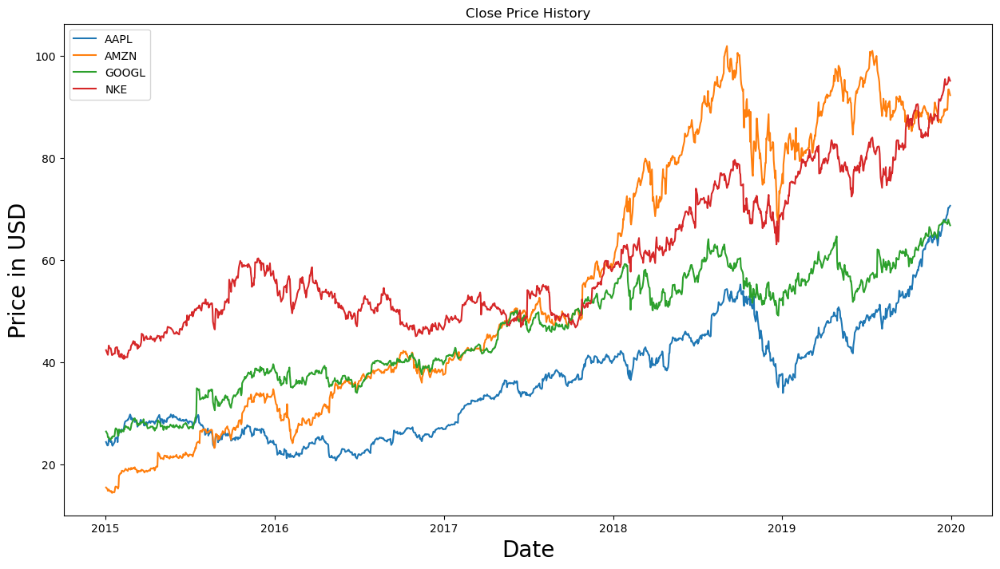

In [171]:
# Closing Price History
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(df)
plt.title('Close Price History')
plt.xlabel('Date',fontsize =20)
plt.ylabel('Price in USD',fontsize = 20)
ax.legend(df.columns.values)
plt.savefig("Stimations.png")
plt.show()

Plot to understand the adjusted closing price of all the assets

In [78]:
# Log of percentage change
cov_matrix = df.pct_change().apply(lambda x: np.log(1+x)).cov()
cov_matrix

Ticker,AAPL,AMZN,GOOGL,NKE
Ticker,,,,
AAPL,0.000246,0.000142,0.000122,0.000084
AMZN,0.000142,0.000334,0.000176,0.000092
GOOGL,0.000122,0.000176,0.000222,0.000085
NKE,0.000084,0.000092,0.000085,0.000219


In [79]:
# Yearly returns for individual companies
ind_er = df.resample('YE').last().pct_change().mean()
ind_er

Ticker
AAPL     0.357854
AMZN     0.295745
GOOGL    0.155478
NKE      0.160666
dtype: float64

Above we find the yearly returns for all the assets choosen

In [81]:
# Volatility is given by the annual standard deviation. 
# We multiply by 252 because there are 252 trading days/year.
ann_sd = df.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(252))
ann_sd


Ticker
AAPL     0.248861
AMZN     0.289922
GOOGL    0.236314
NKE      0.234850
dtype: float64

In [82]:
assets = pd.concat([ind_er, ann_sd], axis=1) # Creating a table for visualising returns and volatility of assets
assets.columns = ['Returns', 'Volatility']
assets

,Returns,Volatility
Ticker,,
AAPL,0.357854,0.248861
AMZN,0.295745,0.289922
GOOGL,0.155478,0.236314
NKE,0.160666,0.234850


Volatility and Returns for all the assets have been found above

In [84]:
p_ret = [] # Define an empty array for portfolio returns
p_vol = [] # Define an empty array for portfolio volatility
p_weights = [] # Define an empty array for asset weights

num_assets = len(df.columns)
num_portfolios = 10000

Number of portfolios = 10000

In [86]:
for portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights = weights/np.sum(weights)
    p_weights.append(weights)
    returns = np.dot(weights, ind_er) # Returns are the product of individual expected returns of asset and its 
                                      # weights 
    p_ret.append(returns)
    var = cov_matrix.mul(weights, axis=0).mul(weights, axis=1).sum().sum()# Portfolio Variance
    sd = np.sqrt(var) # Daily standard deviation
    ann_sd = sd*np.sqrt(250) # Annual standard deviation = volatility
    p_vol.append(ann_sd)
    

In [87]:
data = {'Returns':p_ret, 'Volatility':p_vol}

for counter, symbol in enumerate(df.columns.tolist()):
    #print(counter, symbol)
    data[symbol+' weight'] = [w[counter] for w in p_weights]

In [88]:
portfolios=pd.DataFrame(data)                        
portfolios.head() # Dataframe of the 100000 portfolios created

,Returns,Volatility,AAPL weight,AMZN weight,GOOGL weight,NKE weight
0,0.252587,0.192369,0.459153,0.020141,0.258146,0.262560
1,0.237822,0.194963,0.212743,0.270050,0.245256,0.271950
2,0.196864,0.199320,0.001864,0.278799,0.352603,0.366734
3,0.201630,0.200335,0.004388,0.308964,0.315339,0.371308
4,0.298728,0.208766,0.495216,0.301977,0.073172,0.129635


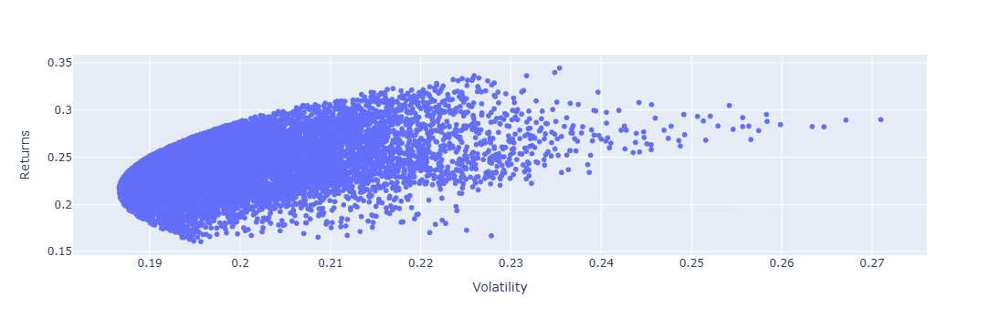

In [89]:
# Ploting efficient frontier
portfolios.plot.scatter(x='Volatility', y='Returns')

In [90]:
min_vol_port = portfolios.iloc[portfolios['Volatility'].idxmin()]
# idxmin() gives us the minimum value in the column specified.                               
min_vol_port

Returns         0.218055
Volatility      0.186600
AAPL weight     0.268847
AMZN weight     0.043524
GOOGL weight    0.289791
NKE weight      0.397838
Name: 8433, dtype: float64

C:\Users\crisa\AppData\Local\Temp\ipykernel_11692\1792874120.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



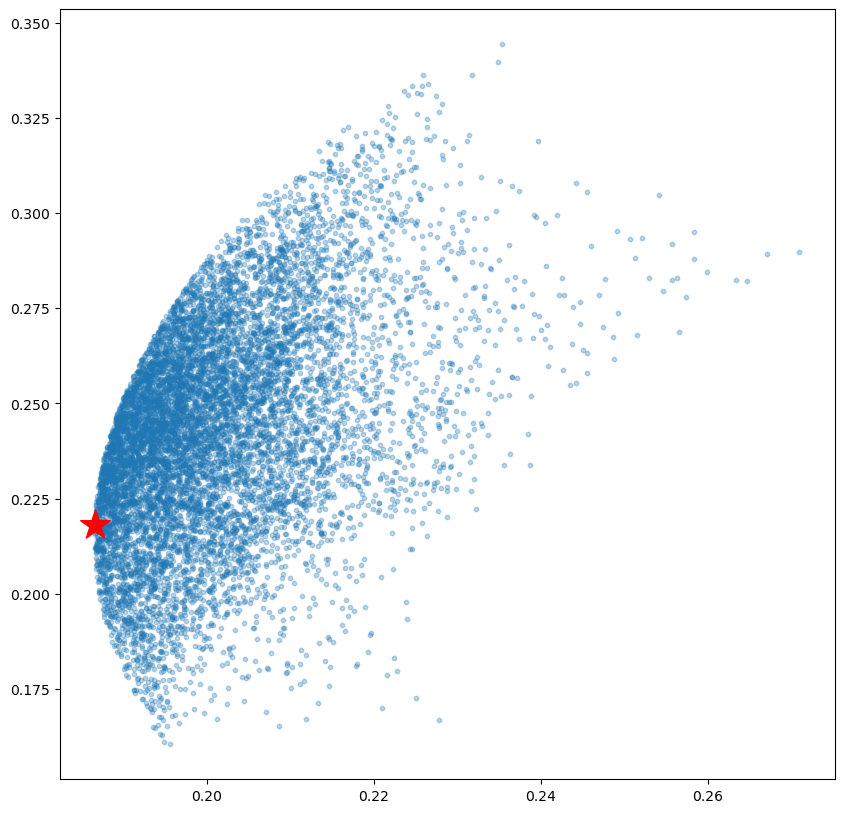

In [91]:
# plotting the minimum volatility portfolio
plt.subplots(figsize=[10,10])
plt.scatter(portfolios['Volatility'], portfolios['Returns'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port[1], min_vol_port[0], color='r', marker='*', s=500)


In [92]:
# Finding the optimal portfolio
rf = 0.01 # risk factor
optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
optimal_risky_port

Returns         0.336265
Volatility      0.225919
AAPL weight     0.775730
AMZN weight     0.167615
GOOGL weight    0.001484
NKE weight      0.055171
Name: 5980, dtype: float64

Above is the weights associated with each asset of portfolio

C:\Users\crisa\AppData\Local\Temp\ipykernel_11692\1395514364.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\crisa\AppData\Local\Temp\ipykernel_11692\1395514364.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



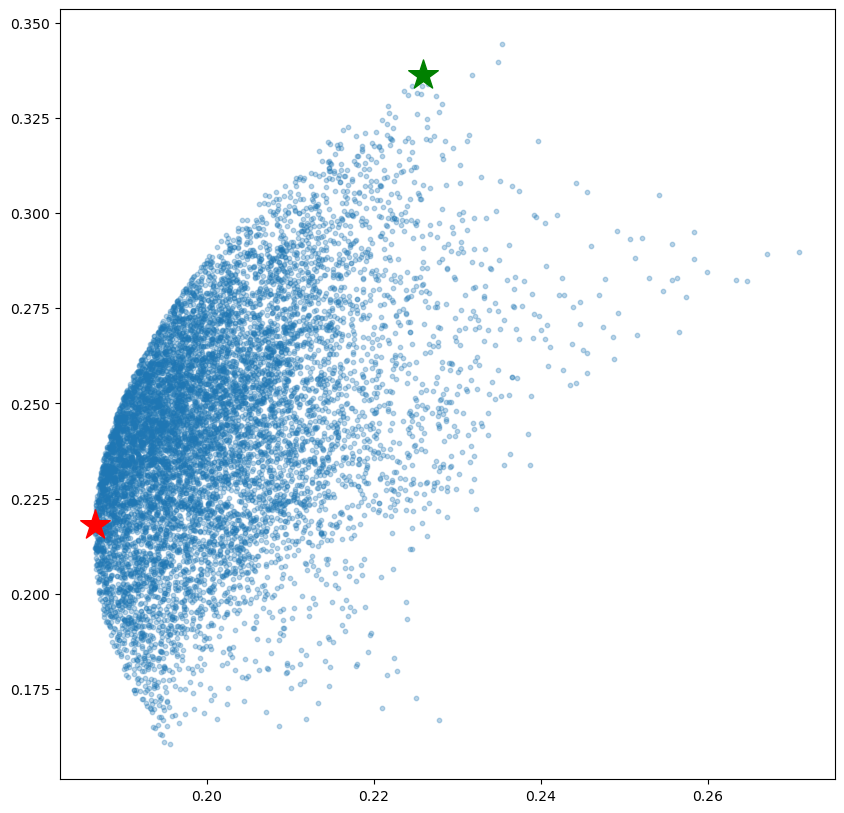

In [175]:
# Plotting optimal portfolio
plt.subplots(figsize=(10, 10))
plt.scatter(portfolios['Volatility'], portfolios['Returns'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port[1], min_vol_port[0], color='r', marker='*', s=500)
plt.scatter(optimal_risky_port[1], optimal_risky_port[0], color='g', marker='*', s=500)
plt.savefig("Valatility.png")

For the extras part refer the other juypter notebook, it includes an attempt approach via quantum gates. I have also added 
a file containing the recommendations and extras in the google drive